<a href="https://colab.research.google.com/github/AbhiramSankar/Discrete_PSO_for_TSP/blob/main/Discrete_PSO_for_TSP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import math
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML
import itertools
from google.colab import files
from matplotlib.animation import FFMpegWriter

In [ ]:
# --- Utility Functions ---
def get_swaps(a, b):
    a = a.copy()
    swaps = []
    for i in range(len(a)):
        if a[i] != b[i]:
            j = np.where(a == b[i])[0][0]
            swaps.append((i, j))
            a[i], a[j] = a[j], a[i]
    return swaps

def route_length(route, dist_matrix):
    return sum(dist_matrix[route[i], route[(i + 1) % len(route)]] for i in range(len(route)))

def greedy_nn(dist_matrix, start=0):
    n = len(dist_matrix)
    unvisited = set(range(n))
    route = [start]
    unvisited.remove(start)
    current = start
    while unvisited:
        next_city = min(unvisited, key=lambda j: dist_matrix[current, j])
        route.append(next_city)
        unvisited.remove(next_city)
        current = next_city
    return route

In [ ]:
# --- PSO Core ---
def run_pso(dist_matrix, num_particles=100, max_iters=100, c1=1.5, c2=1.5):
    n = len(dist_matrix)
    swarm = [np.random.permutation(n) for _ in range(num_particles)]
    pbest = [p.copy() for p in swarm]
    pbest_dist = [route_length(p, dist_matrix) for p in pbest]
    best_idx = np.argmin(pbest_dist)
    gbest = pbest[best_idx].copy()
    gbest_dist = pbest_dist[best_idx]

    gbest_history, gbest_distances, diversity_history = [], [], []

    for _ in range(max_iters):
        for i in range(num_particles):
            current = swarm[i].copy()
            ps = get_swaps(current, pbest[i])
            gs = get_swaps(current, gbest)

            for u, v in ps:
                if np.random.rand() < c1 / (c1 + c2):
                    current[u], current[v] = current[v], current[u]
            for u, v in gs:
                if np.random.rand() < c2 / (c1 + c2):
                    current[u], current[v] = current[v], current[u]

            swarm[i] = current
            d = route_length(current, dist_matrix)
            if d < pbest_dist[i]:
                pbest[i] = current.copy()
                pbest_dist[i] = d
                if d < gbest_dist:
                    gbest = current.copy()
                    gbest_dist = d

        gbest_history.append(gbest.copy())
        gbest_distances.append(gbest_dist)
        diversity_history.append(np.mean([
            np.sum(p != q) for p, q in itertools.combinations(swarm, 2)
        ]))

    return gbest, gbest_dist, gbest_history, gbest_distances, diversity_history, swarm



In [ ]:
num_cities = 15
coords_rand = np.random.rand(num_cities, 2)  # 2D points in [0,1]x[0,1]

# --- Distance Matrix ---
dist_matrix_rand = np.linalg.norm(coords_rand[:, None, :] - coords_rand[None, :, :], axis=2)

In [ ]:
cities = {
    "Toronto":      (43.651070, -79.347015),
    "Montreal":     (45.501689, -73.567256),
    "Vancouver":    (49.282729, -123.120738),
    "Calgary":      (51.044733, -114.071883),
    "Edmonton":     (53.546124, -113.493823),
    "Ottawa":       (45.421530, -75.697193),
    "Winnipeg":     (49.895136, -97.138374),
    "Quebec City":  (46.813878, -71.207981),
    "Hamilton":     (43.255721, -79.871102),
    "Kitchener":    (43.451639, -80.492534),
    "London ON":    (42.984923, -81.245277),
    "Victoria":     (48.428421, -123.365644),
    "Halifax":      (44.648764, -63.575239),
    "Oshawa":       (43.897102, -78.865794),
    "Windsor":      (42.314937, -83.036363)
}
city_names = list(cities.keys())
num_cities = len(city_names)

# --- Coordinates array: shape (n, 2) → (lat, lon)
coords_cities = np.array([cities[name] for name in city_names])

# --- Haversine Distance Matrix (in km)
def haversine(a, b):
    lat1, lon1 = map(math.radians, a)
    lat2, lon2 = map(math.radians, b)
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    h = math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2)**2
    return 6371 * 2 * math.asin(math.sqrt(h))  # Earth radius = 6371 km

dist_matrix_cities = np.zeros((num_cities, num_cities))
for i in range(num_cities):
    for j in range(num_cities):
        dist_matrix_cities[i, j] = haversine(coords_cities[i], coords_cities[j])

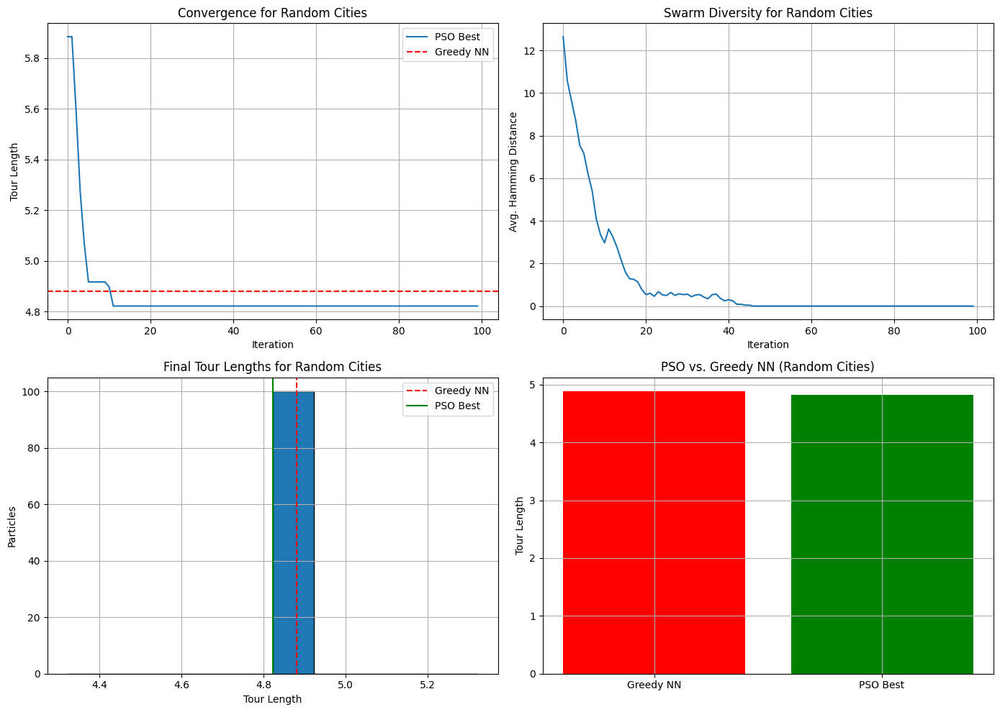

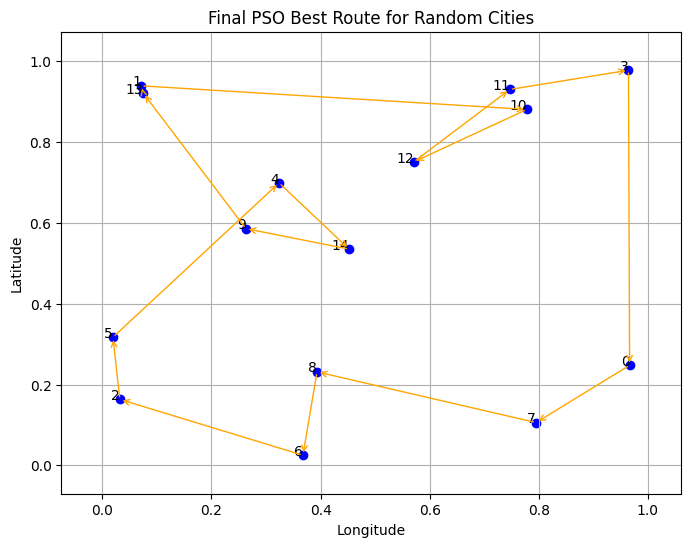

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


===== Summary for Random Cities =====
Greedy NN Distance: 4.88
Best PSO Distance: 4.82
Improvement over Greedy: 1.20%
Final Swarm Avg Fitness: 4.82, Std Dev: 0.00


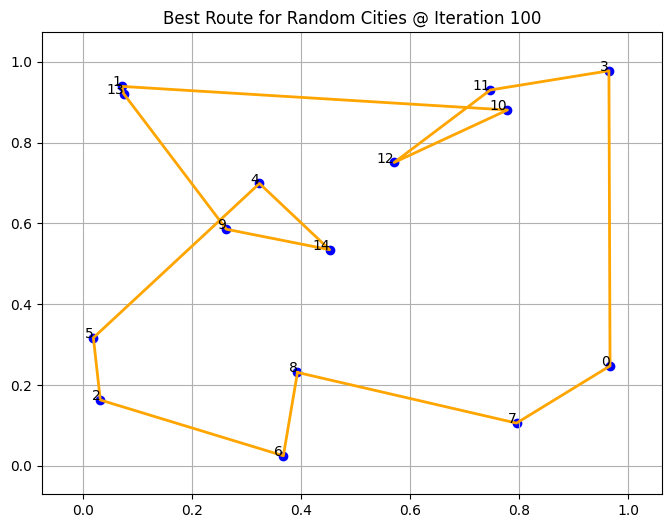

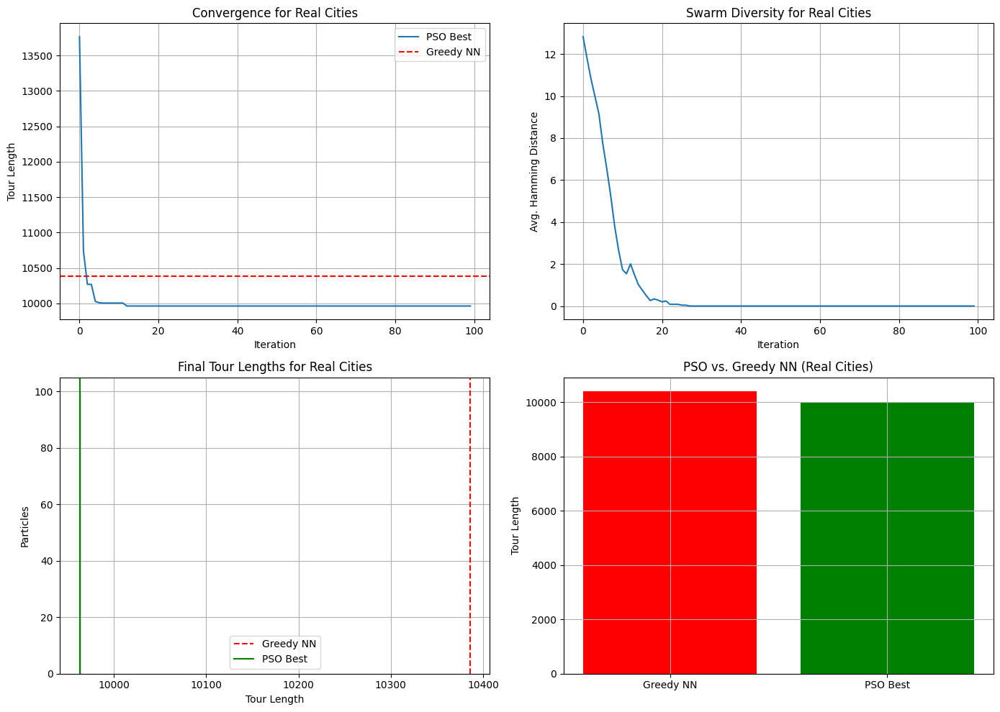

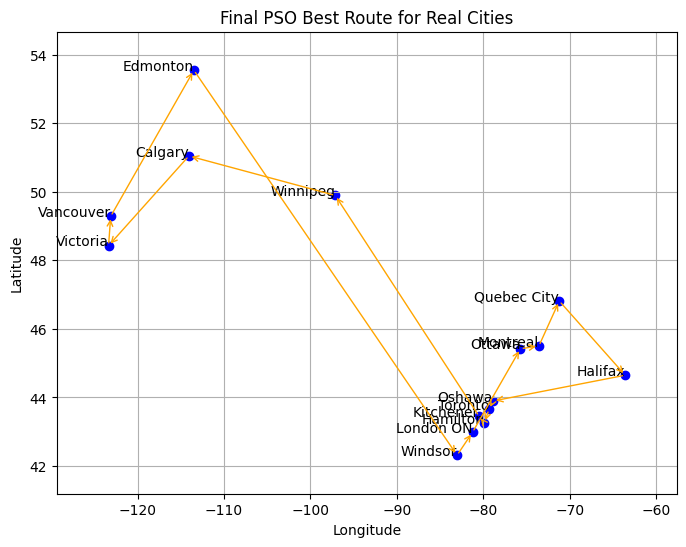

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


===== Summary for Real Cities =====
Greedy NN Distance: 10386.20
Best PSO Distance: 9963.38
Improvement over Greedy: 4.07%
Final Swarm Avg Fitness: 9963.38, Std Dev: 0.00


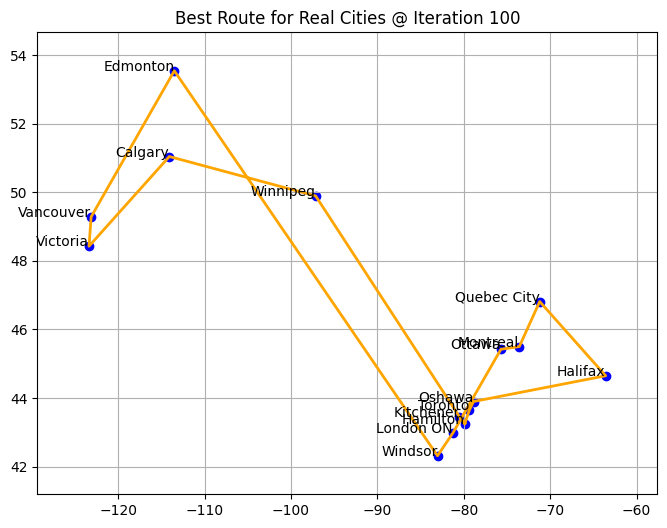

In [ ]:
for label, (coords, dist_matrix) in [("Random Cities", (coords_rand, dist_matrix_rand)),
                              ("Real Cities", (coords_cities, dist_matrix_cities))]:


  # --- Run Greedy and PSO ---
  baseline = greedy_nn(dist_matrix)
  baseline_length = route_length(baseline, dist_matrix)
  gbest, gbest_dist, gbest_history, gbest_distances, diversity, swarm = run_pso(dist_matrix)

  x_vals = coords[:, 1]
  y_vals = coords[:, 0]
  x_pad = (x_vals.max() - x_vals.min()) * 0.1
  y_pad = (y_vals.max() - y_vals.min()) * 0.1
  xlim = (x_vals.min() - x_pad, x_vals.max() + x_pad)
  ylim = (y_vals.min() - y_pad, y_vals.max() + y_pad)

  # --- Plot Convergence and Comparison ---
  fig, axs = plt.subplots(2, 2, figsize=(14, 10))

  # 1. Convergence
  axs[0, 0].plot(gbest_distances, label="PSO Best")
  axs[0, 0].axhline(baseline_length, color='r', linestyle='--', label="Greedy NN")
  axs[0, 0].set_title(f"Convergence for {label}")
  axs[0, 0].set_xlabel("Iteration")
  axs[0, 0].set_ylabel("Tour Length")
  axs[0, 0].legend()
  axs[0, 0].grid(True)

  # 2. Diversity
  axs[0, 1].plot(diversity)
  axs[0, 1].set_title(f"Swarm Diversity for {label}")
  axs[0, 1].set_xlabel("Iteration")
  axs[0, 1].set_ylabel("Avg. Hamming Distance")
  axs[0, 1].grid(True)


  # 3. Histogram of final tour lengths
  final_lengths = [route_length(p, dist_matrix) for p in swarm]
  axs[1, 0].hist(final_lengths, bins=10, edgecolor='black')
  axs[1, 0].axvline(baseline_length, color='r', linestyle='--', label='Greedy NN')
  axs[1, 0].axvline(gbest_distances[-1], color='g', linestyle='-', label='PSO Best')
  axs[1, 0].set_title(f"Final Tour Lengths for {label}")
  axs[1, 0].set_xlabel("Tour Length")
  axs[1, 0].set_ylabel("Particles")
  axs[1, 0].legend()
  axs[1, 0].grid(True)


  # 4. Bar comparison
  axs[1, 1].bar(["Greedy NN", "PSO Best"], [baseline_length, gbest_distances[-1]], color=["red", "green"])
  axs[1, 1].set_title(f"PSO vs. Greedy NN ({label})")
  axs[1, 1].set_ylabel("Tour Length")
  axs[1, 1].grid(True)


  plt.tight_layout()
  plt.show()

  #6. Best Route
  x_min, x_max = coords[:, 1].min(), coords[:, 1].max()
  y_min, y_max = coords[:, 0].min(), coords[:, 0].max()
  padding_x = (x_max - x_min) * 0.1
  padding_y = (y_max - y_min) * 0.1
  xlim = (x_min - padding_x, x_max + padding_x)
  ylim = (y_min - padding_y, y_max + padding_y)

  best_route = np.append(gbest, gbest[0])

  plt.figure(figsize=(8, 6))
  plt.scatter(coords[:, 1], coords[:, 0], color='blue')

  for i, (lat, lon) in enumerate(coords):
    if label == "Real Cities":
      plt.text(lon, lat, city_names[i], fontsize=10, ha='right')
    else:
      plt.text(lon, lat, str(i), fontsize=10, ha='right')

  for i in range(len(best_route) - 1):
    start = coords[best_route[i]]
    end = coords[best_route[i + 1]]
    plt.annotate("",
        xy=(end[1], end[0]), xytext=(start[1], start[0]),
        arrowprops=dict(arrowstyle="->", color="orange", lw=1)
    )


  plt.title(f"Final PSO Best Route for {label}")
  plt.xlabel("Longitude")
  plt.ylabel("Latitude")
  plt.grid(True)
  plt.xlim(xlim)
  plt.ylim(ylim)
  # plt.gca().set_aspect('equal', adjustable='box')
  plt.show()

  # --- Animated Evolution of Best Route (with City Names) ---
  fig, ax = plt.subplots(figsize=(8, 6))

  # Plot city locations
  ax.scatter(coords[:, 1], coords[:, 0], color='blue')  # lon = x, lat = y

  # Add city name labels
  for i, (lat, lon) in enumerate(coords):
    if label == "Real Cities":
      ax.text(lon, lat, city_names[i], fontsize=10, ha='right')
    else:
      ax.text(lon, lat, str(i), fontsize=10, ha='right')

  line, = ax.plot([], [], lw=2, color='orange')

  # Set map boundaries with margin
  ax.set_xlim(xlim)
  ax.set_ylim(ylim)
  # ax.set_aspect('equal', adjustable='box')
  ax.set_title(f"PSO Best Route Evolution for {label}")
  ax.grid(True)

  def init():
    line.set_data([], [])
    return line,

  def update(frame):
    route = np.append(gbest_history[frame], gbest_history[frame][0])
    lons = coords[route, 1]
    lats = coords[route, 0]
    line.set_data(lons, lats)
    ax.set_title(f"Best Route for {label} @ Iteration {frame + 1}")
    return line,

  anim = FuncAnimation(fig, update, frames=len(gbest_history),
                     init_func=init, blit=True, interval=300)


  anim.save(f"pso_animation_{label}.gif", anim.save("pso_animation.gif", writer='pillow', fps=2))
  files.download(f"pso_animation_{label}.gif")

  display(HTML(anim.to_jshtml()))


  final_lengths = [route_length(p, dist_matrix) for p in swarm]
  mean_fitness = np.mean(final_lengths)
  std_fitness = np.std(final_lengths)
  print(f"\n===== Summary for {label} =====")
  print(f"Greedy NN Distance: {baseline_length:.2f}")
  print(f"Best PSO Distance: {gbest_dist:.2f}")
  print(f"Improvement over Greedy: {(baseline_length - gbest_dist) / baseline_length * 100:.2f}%")
  print(f"Final Swarm Avg Fitness: {mean_fitness:.2f}, Std Dev: {std_fitness:.2f}")
